In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

plt.style.use("ggplot")

## Write a function to simulate multimodal Gaussian distribution

In [2]:
def multimodalGaussian(size, return_hist=False):
    
    ## number of Gaussian distributions to be drawn later
    mixNum = 17
    
    ## Generate means and stds of those Gaussians
    mus = np.random.randint(1, 100, mixNum)
    
    sigmas = np.random.random(mixNum) * 10 + 1
    
    pos = np.arange(len(mus)) / len(mus)
    
    ## 0-based indexing
    idx = np.digitize(np.random.random(size), pos) - 1
    
    a = map(lambda x: mus[x], idx)
    b = map(lambda x: sigmas[x], idx)
    
    sample = [mu + sigma * np.random.randn() for mu, sigma in zip(a, b)] 
    
    if return_hist:
        hist, _ = np.histogram(sample, bins=250)
        return hist
    
    return sample

## Simulated Annealing

In [3]:
def simulatedAnnealing(arr):
    
    length = len(arr)
    
    ## Initial temperature
    temperature = 100

    ## Current state
    s_curr = np.random.randint(length)
    
    trajectory = []
    
    while temperature >= 1:
        
        ## Next state
        s_next = np.random.randint(low=max(0, s_curr - int(0.3 * length)),
                                   high=min(length, s_curr + int(0.3 * length)))

        ## Current energy
        E_curr = - arr[s_curr]

        ## Next energy
        E_next = - arr[s_next]

        ## Difference of energy
        loss = E_next - E_curr

        if (loss < 0):
            s_curr = s_next
        else:
            prob = np.exp(-loss / (temperature * 0.2))
            
            if (prob >= np.random.random()):
                s_curr = s_next
        
        ## Record the state, energy, and temperature
        ## E_curr may have been changed, use -arr[s_curr] instead
        trajectory.append([s_curr, -arr[s_curr], temperature])
        temperature -= 1
        
    return s_curr, trajectory

## First we draw a bumpy hill

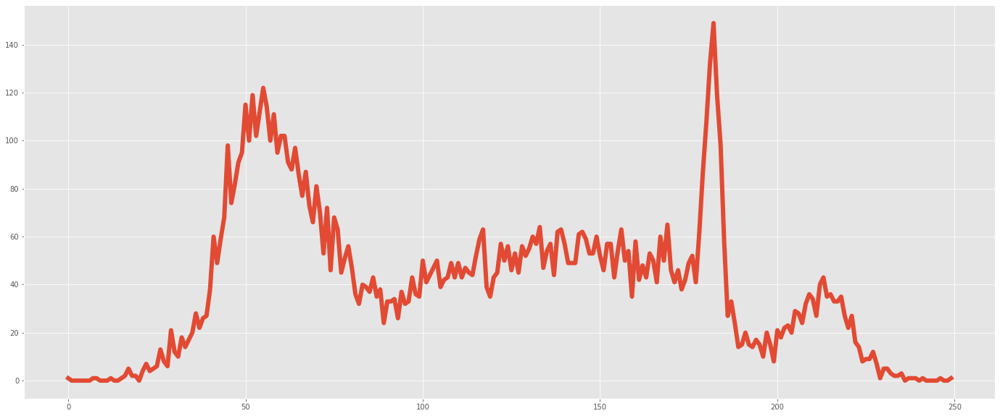

In [4]:
# sample = multiModalGaussian(size=5000)
# plt.hist(sample, bins=120);
plt.figure(figsize=(24, 10))
hist = multimodalGaussian(size=10000, return_hist=True)
plt.plot(hist, linewidth=6);

## Run the simulated annealing method

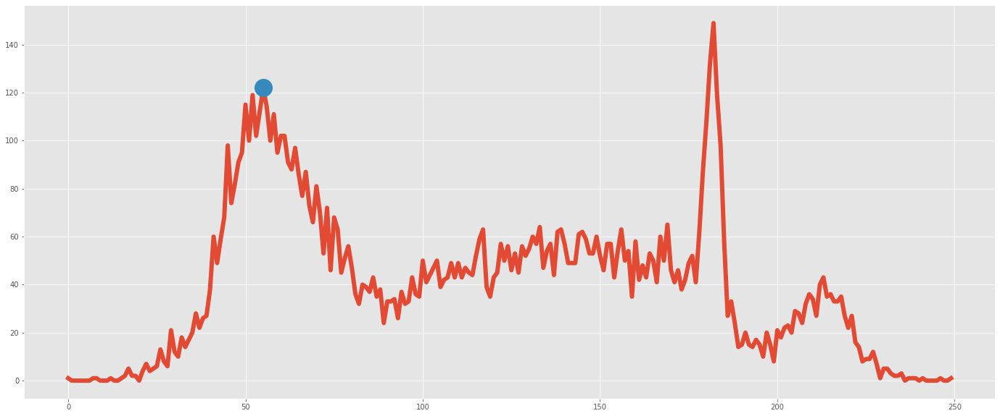

In [5]:
s_final, trajectory = simulatedAnnealing(hist)
plt.figure(figsize=(24, 10))
plt.plot(hist, linewidth=6)

## Returns only the position of the final state
plt.plot(s_final, hist[s_final], marker='o', markersize=24, linewidth=12);

## Using animation to check the trajectory of the state

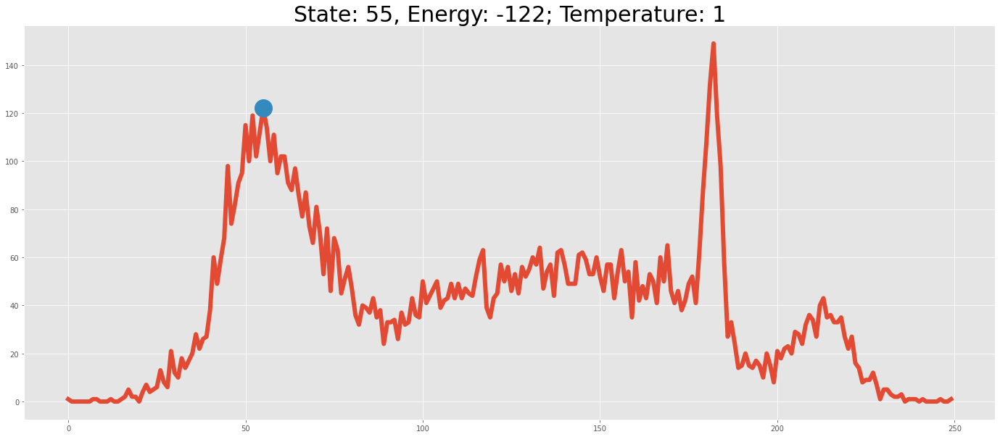

In [6]:
fig = plt.figure(figsize=(24, 10))

def update(i, data):
    
    state = data[i][0]
    energy = data[i][1]
    temperature = data[i][2]
    
    plt.cla()
    plt.plot(hist, linewidth=6)
    plt.plot(state, hist[state],
             marker='o',
             markersize=24,
             linewidth=12);
    
    title = f"State: {state}, Energy: {energy}; Temperature: {temperature}"
    plt.title(title, fontsize=30);

ani = animation.FuncAnimation(fig, update, len(trajectory), fargs=(trajectory,))
HTML(ani.to_jshtml())